<a href="https://colab.research.google.com/github/Bhandari007/DCGAN/blob/main/GANText2Image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
## Extract dataset
import zipfile
zip_ref = zipfile.ZipFile("/content/drive/MyDrive/Experiment_2.zip")
zip_ref.extractall()
zip_ref.close()

In [ ]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import os
import pickle
import random
import time

import numpy as np
import pandas as pd
import tensorflow as tf

assert tf.__version__.startswith('2')

import PIL
from PIL import Image
import matplotlib.pyplot as plt
import tensorflow.keras.backend as K
from tensorflow.keras import Input, Model
from tensorflow.keras.layers import LeakyReLU, BatchNormalization, ReLU, Activation
from tensorflow.keras.layers import UpSampling2D, Conv2D, Concatenate, Dense, concatenate, Dropout
from tensorflow.keras.layers import Flatten, Lambda, Reshape, ZeroPadding2D, add, Conv2DTranspose
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
def conditioning_augmentation(x):
	"""The mean_logsigma passed as argument is converted into the text conditioning variable.

	Args:
		x: The output of the text embedding passed through a FC layer with LeakyReLU non-linearity.

	Returns:
	 	c: The text conditioning variable after computation.
	"""
	mean = x[:, :128]
	log_sigma = x[:, 128:]

	stddev = tf.math.exp(log_sigma)
	epsilon = K.random_normal(shape=K.constant((mean.shape[1], ), dtype='int32'))
	c = mean + stddev * epsilon
	return c

def build_ca_network():
	"""Builds the conditioning augmentation network.
	"""
	input_layer1 = Input(shape=(1024,)) #size of the vocabulary in the text data
	mls = Dense(256)(input_layer1)
	mls = LeakyReLU(alpha=0.2)(mls)
	ca = Lambda(conditioning_augmentation)(mls)
	return Model(inputs=[input_layer1], outputs=[ca])

In [ ]:
def UpSamplingBlock(x, num_kernels):
	"""An Upsample block with Upsampling2D, Conv2D, BatchNormalization and a ReLU activation.

	Args:
		x: The preceding layer as input.
		num_kernels: Number of kernels for the Conv2D layer.

	Returns:
		x: The final activation layer after the Upsampling block.
	"""
	x = UpSampling2D(size=(2,2))(x)
	x = Conv2D(num_kernels, kernel_size=(3,3), padding='same', strides=1, use_bias=False,
				kernel_initializer='he_uniform')(x)
	x = BatchNormalization(gamma_initializer='ones', beta_initializer='zeros')(x) #prevent from mode collapse
	x = ReLU()(x)
	return x


def build_stage1_generator():

	input_layer1 = Input(shape=(1024,))
	ca = Dense(256)(input_layer1)
	ca = LeakyReLU(alpha=0.2)(ca)

	# Obtain the conditioned text
	c = Lambda(conditioning_augmentation)(ca)

	input_layer2 = Input(shape=(100,))
	concat = Concatenate(axis=1)([c, input_layer2]) 

	# 16384
	x = Dense(16384, use_bias=False)(concat) 
	x = ReLU()(x)
	x = Reshape((4, 4, 1024), input_shape=(16384,))(x)
 
	

	x = UpSamplingBlock(x, 512) 
	x = UpSamplingBlock(x, 256)
	x = UpSamplingBlock(x, 128)
	x = UpSamplingBlock(x, 64)   # upsampled our image to 64*64*3 

	x = Conv2D(3, kernel_size=3, padding='same', strides=1, use_bias=False,
				kernel_initializer='he_uniform')(x)
	x = Activation('tanh')(x)

	stage1_gen = Model(inputs=[input_layer1, input_layer2], outputs=[x, ca]) 
	return stage1_gen

In [ ]:
generator = build_stage1_generator()
generator.summary()

Model: "model_26"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_51 (InputLayer)          [(None, 1024)]       0           []                               
                                                                                                  
 dense_26 (Dense)               (None, 256)          262400      ['input_51[0][0]']               
                                                                                                  
 leaky_re_lu_40 (LeakyReLU)     (None, 256)          0           ['dense_26[0][0]']               
                                                                                                  
 lambda_10 (Lambda)             (None, 128)          0           ['leaky_re_lu_40[0][0]']         
                                                                                           

In [100]:
from tensorflow.python.ops.math_ops import xdivy_eager_fallback
def ConvBlock(x, num_kernels, kernel_size=(4,4), strides=2, activation=True):
	"""A ConvBlock with a Conv2D, BatchNormalization and LeakyReLU activation.

	Args:
		x: The preceding layer as input.
		num_kernels: Number of kernels for the Conv2D layer.

	Returns:
		x: The final activation layer after the ConvBlock block.
	"""
	x = Conv2D(num_kernels, kernel_size=kernel_size, padding='same', strides=strides, use_bias=False,
				kernel_initializer='he_uniform')(x)
	x = BatchNormalization(gamma_initializer='ones', beta_initializer='zeros')(x)
	
	if activation:
		x = LeakyReLU(alpha=0.2)(x)
	return x

def build_embedding_compressor():
    """Build embedding compressor model
    """
    input_layer1 = Input(shape=(1024,)) 
    x = Dense(128)(input_layer1)
    x = ReLU()(x)

    model = Model(inputs=[input_layer1], outputs=[x])
    return model

# the discriminator is fed with two inputs, the feature from Generator and the text embedding
def build_stage1_discriminator():
	"""Builds the Stage 1 Discriminator that uses the 64x64 resolution images from the generator
	and the compressed and spatially replicated embedding.

	Returns:
		Stage 1 Discriminator Model for StackGAN.
	"""
	input_layer1 = Input(shape=(64, 64, 3))  

	x = Conv2D(64, kernel_size=(4,4), strides=2, padding='same', use_bias=False,
				kernel_initializer='he_uniform')(input_layer1)
	x = LeakyReLU(alpha=0.2)(x)

	x = ConvBlock(x, 128)
	x = ConvBlock(x, 256)
	x = ConvBlock(x, 512)
  

	# Obtain the compressed and spatially replicated text embedding
	input_layer2 = Input(shape=(4, 4, 128)) #2nd input to discriminator, text embedding
	concat = concatenate([x, input_layer2])
	

	x1 = Conv2D(512, kernel_size=(1,1), padding='same', strides=1, use_bias=False,
				kernel_initializer='he_uniform')(concat)
	x1 = BatchNormalization(gamma_initializer='ones', beta_initializer='zeros')(x)
	x1 = LeakyReLU(alpha=0.2)(x)

	# Flatten and add a FC layer to predict.
	x1 = Flatten()(x1)
	x1 = Dense(1)(x1)
	x1 = Activation('sigmoid')(x1)

	stage1_dis = Model(inputs=[input_layer1, input_layer2], outputs=[x1])  
	return stage1_dis

In [ ]:
discriminator = build_stage1_discriminator()
discriminator.summary()

Model: "model_27"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_53 (InputLayer)          [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 conv2d_65 (Conv2D)             (None, 32, 32, 64)   3072        ['input_53[0][0]']               
                                                                                                  
 leaky_re_lu_41 (LeakyReLU)     (None, 32, 32, 64)   0           ['conv2d_65[0][0]']              
                                                                                                  
 conv2d_66 (Conv2D)             (None, 16, 16, 128)  131072      ['leaky_re_lu_41[0][0]']         
                                                                                           

In [ ]:
# Building GAN with Generator and Discriminator

def build_adversarial(generator_model, discriminator_model):
	"""Stage 1 Adversarial model.

	Args:
		generator_model: Stage 1 Generator Model
		discriminator_model: Stage 1 Discriminator Model

	Returns:
		Adversarial Model.
	"""
	input_layer1 = Input(shape=(1024,))  
	input_layer2 = Input(shape=(100,)) 
	input_layer3 = Input(shape=(4, 4, 128)) 

	x, ca = generator_model([input_layer1, input_layer2]) #text,noise

	discriminator_model.trainable = False 

	probabilities = discriminator_model([x, input_layer3]) 
	adversarial_model = Model(inputs=[input_layer1, input_layer2, input_layer3], outputs=[probabilities, ca])
	return adversarial_model

In [101]:
ganstage1 = build_adversarial(generator, discriminator)
ganstage1.summary()

Model: "model_55"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_106 (InputLayer)         [(None, 1024)]       0           []                               
                                                                                                  
 input_107 (InputLayer)         [(None, 100)]        0           []                               
                                                                                                  
 model_26 (Functional)          [(None, 64, 64, 3),  10270400    ['input_106[0][0]',              
                                 (None, 256)]                     'input_107[0][0]']              
                                                                                                  
 input_108 (InputLayer)         [(None, 4, 4, 128)]  0           []                        

In [102]:
image_size = 64
batch_size = 20
z_dim = 100
stage1_generator_lr = 0.0002
stage1_discriminator_lr = 0.0002
stage1_lr_decay_step = 600
epochs = 50
condition_dim = 128


# Class info files
train_class_info = "class_info/train_class_info.pickle"
test_class_info = "class_info/test_class_info.pickle"


# Embeddings File
train_embeddings_file = "embeddings/train_embeddings.pickle"
test_embeddings_file = "embeddings/test_embeddings.pickle"

# Filenames File
train_filenames = "filenames/train_filenames.pickle"
test_filenames = "filenames/test_filenames.pickle"


# Image Dataset
train_images = "train_images/"

test_images = "test_images/"

bounding_box_dir = "bounding_boxes.txt"


## Explore the training images

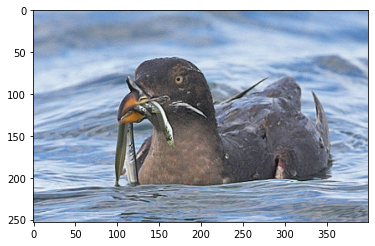

In [103]:
for i in range(0, 2):
  for folders in os.listdir(train_images):
    for files in os.listdir(os.path.join(train_images, folders)):
      image_path = os.path.join(train_images, folders, files)
      img = np.asarray(Image.open(image_path))
    plt.imshow(img)   

In [104]:
def checkpoint_prefix():
	checkpoint_dir = 'constants/training_checkpoints'
	checkpoint_prefix = os.path.join(checkpoint_dir, 'ckpt')

	return checkpoint_prefix

In [105]:
def adversarial_loss(y_true, y_pred):
	mean = y_pred[:, :128]
	ls = y_pred[:, 128:]
	loss = -ls + 0.5 * (-1 + tf.math.exp(2.0 * ls) + tf.math.square(mean))
	loss = K.mean(loss)
	return loss

In [106]:
def normalize(input_image, real_image):
	input_image = (input_image / 127.5) - 1
	real_image = (real_image / 127.5) - 1

	return input_image, real_image

In [107]:
def load_class_ids_filenames(class_id_path, filename_path):
	with open(class_id_path, 'rb') as file:
		class_id = pickle.load(file, encoding='latin1')

	with open(filename_path, 'rb') as file:
		filename = pickle.load(file, encoding='latin1')

	return class_id, filename

In [108]:
def load_text_embeddings(text_embeddings):
	with open(text_embeddings, 'rb') as file:
		embeds = pickle.load(file, encoding='latin1')
		embeds = np.array(embeds)

	return embeds

In [109]:
def load_bbox(data_path):
	bbox_path = data_path
	image_path = 'images.txt'
	bbox_df = pd.read_csv(bbox_path, delim_whitespace=True, header=None).astype(int)
	filename_df = pd.read_csv(image_path, delim_whitespace=True, header=None)

	filenames = filename_df[1].tolist()
	bbox_dict = {i[:-4]:[] for i in filenames[:2]}

	for i in range(0, len(filenames)):
		bbox = bbox_df.iloc[i][1:].tolist()
		dict_key = filenames[i][:-4]
		bbox_dict[dict_key] = bbox

	return bbox_dict

In [110]:
def load_images(image_path, bounding_box, size):
	"""Crops the image to the bounding box and then resizes it.
	"""
	image = Image.open(image_path).convert('RGB')
	w, h = image.size
	if bounding_box is not None:
		r = int(np.maximum(bounding_box[2], bounding_box[3]) * 0.75)
		c_x = int((bounding_box[0] + bounding_box[2]) / 2)
		c_y = int((bounding_box[1] + bounding_box[3]) / 2)
		y1 = np.maximum(0, c_y - r)
		y2 = np.minimum(h, c_y + r)
		x1 = np.maximum(0, c_x - r)
		x2 = np.minimum(w, c_x + r)
		image = image.crop([x1, y1, x2, y2])

	image = image.resize(size, PIL.Image.BILINEAR)
	return image

In [111]:
def load_data(filename_path, class_id_path, dataset_path, embeddings_path,size):
	"""Loads the Dataset.
	"""

  
	class_id, filenames = load_class_ids_filenames(class_id_path, filename_path)
	embeddings = load_text_embeddings(embeddings_path)
	bbox_dict = load_bbox(bounding_box_dir)

	x, y, embeds = [], [], []

	for i, filename in enumerate(filenames[:100]):
		bbox = bbox_dict[filename]

		try:	
			image_path = f'{dataset_path}/{filename}.jpg'
			image = load_images(image_path, bbox, size)
			e = embeddings[i]
			embed_index = np.random.randint(0, e.shape[0] - 1)
			embed = e[embed_index, :]

			x.append(np.array(image))
			y.append(class_id[i])
			embeds.append(embed)

		except Exception as e:
			print(f'{e}')
	
	x = np.array(x)
	y = np.array(y)
	embeds = np.array(embeds)
	
	return x, y, embeds

In [112]:
def save_image(file, save_path):
	"""Saves the image at the specified file path.
	"""
	image = plt.figure()
	ax = image.add_subplot(1,1,1)
	ax.imshow(file)
	ax.axis("off")
	plt.savefig(save_path)

In [117]:

############################################################
# StackGAN class
############################################################

class StackGanStage1(object):

  """StackGAN Stage 1 class."""
  
  def __init__(self, epochs=200, z_dim=100, batch_size=32, enable_function=True, stage1_generator_lr=0.0002, stage1_discriminator_lr=0.0002):
		# change epochs to 500
	  self.epochs = epochs
	  self.z_dim = z_dim
	  self.enable_function = enable_function
	  self.stage1_generator_lr = stage1_generator_lr
	  self.stage1_discriminator_lr = stage1_discriminator_lr
	  self.image_size = 64
	  self.conditioning_dim = 128
	  self.batch_size = batch_size
        
	  self.stage1_generator_optimizer = Adam(lr=stage1_generator_lr, beta_1=0.5, beta_2=0.999)
	  self.stage1_discriminator_optimizer = Adam(lr=stage1_discriminator_lr, beta_1=0.5, beta_2=0.999)
        
	  self.stage1_generator = build_stage1_generator()
	  self.stage1_generator.compile(loss='mse', optimizer=self.stage1_generator_optimizer)

	  self.stage1_discriminator = build_stage1_discriminator()
	  self.stage1_discriminator.compile(loss='binary_crossentropy', optimizer=self.stage1_discriminator_optimizer)

	  self.ca_network = build_ca_network()
	  self.ca_network.compile(loss='binary_crossentropy', optimizer='Adam')

	  self.embedding_compressor = build_embedding_compressor()
	  self.embedding_compressor.compile(loss='binary_crossentropy', optimizer='Adam')

	  self.stage1_adversarial = build_adversarial(self.stage1_generator, self.stage1_discriminator)
	  self.stage1_adversarial.compile(loss=['binary_crossentropy', adversarial_loss], loss_weights=[1, 2.0], optimizer=self.stage1_generator_optimizer)

	  self.checkpoint1 = tf.train.Checkpoint(
        	generator_optimizer=self.stage1_generator_optimizer,
        	discriminator_optimizer=self.stage1_discriminator_optimizer,
        	generator=self.stage1_generator,
        	discriminator=self.stage1_discriminator)

  def visualize_stage1(self):
	  """Running Tensorboard visualizations.
		"""
	  tb = TensorBoard(log_dir="constants/logs/".format(time.time()))
	  tb.set_model(self.stage1_generator)
	  tb.set_model(self.stage1_discriminator)
	  tb.set_model(self.ca_network)
	  tb.set_model(self.embedding_compressor)

  def train_stage1(self):
	  """Trains the stage1 StackGAN.
    """
	  x_train, y_train, train_embeds = load_data(filename_path=train_filenames, class_id_path=train_class_info,
      dataset_path=train_images, embeddings_path=train_embeddings_file, size=(64, 64))

	  x_test, y_test, test_embeds = load_data(filename_path=test_filenames, class_id_path=train_class_info, 
      dataset_path=test_images, embeddings_path=test_embeddings_file, size=(64, 64))

	  real = np.ones((self.batch_size, 1), dtype='float') * 0.9
	  fake = np.zeros((self.batch_size, 1), dtype='float') * 0.1

	  for epoch in range(self.epochs):
		  print(f'Epoch: {epoch}')

		  gen_loss = []
		  dis_loss = []

		  num_batches = int(x_train.shape[0] / self.batch_size)

		  for i in range(num_batches):

		    latent_space = np.random.normal(0, 1, size=(self.batch_size, self.z_dim))
		    embedding_text = train_embeds[i * self.batch_size:(i + 1) * self.batch_size]
		    compressed_embedding = self.embedding_compressor.predict_on_batch(embedding_text)
		    compressed_embedding = np.reshape(compressed_embedding, (-1, 1, 1, 128))
		    compressed_embedding = np.tile(compressed_embedding, (1, 4, 4, 1))

		    image_batch = x_train[i * self.batch_size:(i+1) * self.batch_size]
		    image_batch = (image_batch - 127.5) / 127.5

		    gen_images, _ = self.stage1_generator.predict([embedding_text, latent_space])

		    discriminator_loss = self.stage1_discriminator.train_on_batch([image_batch, compressed_embedding], 
					np.reshape(real, (self.batch_size, 1)))

		    discriminator_loss_gen = self.stage1_discriminator.train_on_batch([gen_images, compressed_embedding],
					np.reshape(fake, (self.batch_size, 1)))

		    discriminator_loss_wrong = self.stage1_discriminator.train_on_batch([gen_images[: self.batch_size-1], compressed_embedding[1:]], 
					np.reshape(fake[1:], (self.batch_size-1, 1)))

		    # Discriminator loss
		    d_loss = 0.5 * np.add(discriminator_loss, 0.5 * np.add(discriminator_loss_gen, discriminator_loss_wrong))
		    dis_loss.append(d_loss)

		    print(f'Discriminator Loss: {d_loss}')

		    # Generator loss
		    g_loss = self.stage1_adversarial.train_on_batch([embedding_text, latent_space, compressed_embedding],
					[K.ones((self.batch_size, 1)) * 0.9, K.ones((self.batch_size, 256)) * 0.9])

		    print(f'Generator Loss: {g_loss}')
		    gen_loss.append(g_loss)

		    if epoch % 5 == 0:
				    latent_space = np.random.normal(0, 1, size=(self.batch_size, self.z_dim))
				    embedding_batch = test_embeds[0 : self.batch_size]
				    gen_images, _ = self.stage1_generator.predict_on_batch([embedding_batch, latent_space])

				    for i, image in enumerate(gen_images[:10]):
				        save_image(image, f'constants/images/test/gen_1_{epoch}_{i}')

		    if epoch % 25 == 0:
		      self.stage1_generator.save_weights('constants/weights/stage1_gen.h5')
		      self.stage1_discriminator.save_weights("constants/weights/stage1_disc.h5")
		      self.ca_network.save_weights('constants/weights/stage1_ca.h5')
		      self.embedding_compressor.save_weights('constants/weights/stage1_embco.h5')
		      self.stage1_adversarial.save_weights('constants/weights/stage1_adv.h5')      

	  self.stage1_generator.save_weights('constants/weights/stage1_gen.h5')
	  self.stage1_discriminator.save_weights("constants/weights/stage1_disc.h5")


<ipython-input-108-b128e51b4577>:4: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  embeds = np.array(embeds)


Epoch: 0
1/1 [==============================] - 0s 137ms/step
Discriminator Loss: 2.984551060083703


Generator Loss: [0.739465057849884, 0.7372910976409912, 0.0010869764955714345]


1/1 [==============================] - 0s 26ms/step
Discriminator Loss: 1.3519442081943127
Generator Loss: [11.2208251953125, 11.21795654296875, 0.001434464007616043]


1/1 [==============================] - 0s 20ms/step


<ipython-input-112-ad1a2e8abd27>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  image = plt.figure()


Discriminator Loss: 3.2619953521013088
Generator Loss: [16.550241470336914, 16.54642677307129, 0.0019071977585554123]


Epoch: 1
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.4921965611647465
Generator Loss: [0.9697813987731934, 0.9646169543266296, 0.002582225948572159]
1/1 [==============================] - 0s 18ms/step
Discriminator Loss: 0.9129761458681491
Generator Loss: [15.134659767150879, 15.128030776977539, 0.00331448414362967]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.4604376966453856
Generator Loss: [1.3126318454742432, 1.3051185607910156, 0.0037566456012427807]
Epoch: 2
1/1 [==============================] - 0s 22ms/step
Discriminator Loss: 0.32852367198938737
Generator Loss: [2.3103811740875244, 2.302196502685547, 0.004092315211892128]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.44981127012340494
Generator Loss: [0.7865566611289978, 0.7778986692428589, 0.004328995477408171]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.34292487551283557
Generator Loss: [11.491044044494629, 11

Generator Loss: [3.8706934452056885, 3.85367488861084, 0.008509226143360138]


1/1 [==============================] - 0s 33ms/step
Discriminator Loss: 0.3596943785669282
Generator Loss: [1.6728670597076416, 1.6531424522399902, 0.00986228883266449]


1/1 [==============================] - 0s 28ms/step
Discriminator Loss: 0.28301497407210263
Generator Loss: [1.490060806274414, 1.4688831567764282, 0.010588805191218853]


Epoch: 6
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.26484492828058137
Generator Loss: [1.648049235343933, 1.6255748271942139, 0.011237192898988724]
1/1 [==============================] - 0s 24ms/step
Discriminator Loss: 0.21885823483171407
Generator Loss: [1.6215068101882935, 1.5983564853668213, 0.011575155891478062]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.24513743599732152
Generator Loss: [0.8544976711273193, 0.8317396640777588, 0.011379016563296318]
Epoch: 7
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.20297129091341048
Generator Loss: [0.7303103804588318, 0.7070200443267822, 0.011645164340734482]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.18662270803906722
Generator Loss: [3.512984275817871, 3.489408016204834, 0.011788137257099152]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.21902351989172075
Generator Loss: [0.6939699649810791, 0

Generator Loss: [1.2512315511703491, 1.2240772247314453, 0.013577164150774479]


1/1 [==============================] - 0s 22ms/step


Discriminator Loss: 0.1684909457108006
Generator Loss: [1.0600290298461914, 1.0319939851760864, 0.01401752233505249]


1/1 [==============================] - 0s 27ms/step


Discriminator Loss: 0.17980287999444045
Generator Loss: [0.44985777139663696, 0.42192959785461426, 0.013964081183075905]


Epoch: 11
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.16789417324434908
Generator Loss: [1.13192880153656, 1.103736400604248, 0.014096216298639774]
1/1 [==============================] - 0s 22ms/step
Discriminator Loss: 0.16574350206883537
Generator Loss: [3.2458415031433105, 3.2175700664520264, 0.014135763049125671]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.17557227861539104
Generator Loss: [0.6798728108406067, 0.6524976491928101, 0.013687586411833763]
Epoch: 12
1/1 [==============================] - 0s 26ms/step
Discriminator Loss: 0.1661461088190208
Generator Loss: [0.6430674195289612, 0.6155928373336792, 0.013737302273511887]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.1645851170851529
Generator Loss: [0.8155050277709961, 0.7879358530044556, 0.013784591108560562]
1/1 [==============================] - 0s 23ms/step
Discriminator Loss: 0.1929193406140257
Generator Loss: [0.4027949869632721, 0.

1/1 [==============================] - 0s 19ms/step


Discriminator Loss: 0.16829137280888062
Generator Loss: [0.8707728981971741, 0.8437525629997253, 0.013510169461369514]


1/1 [==============================] - 0s 23ms/step


Discriminator Loss: 0.17584750603418797
Generator Loss: [0.600980281829834, 0.5738487243652344, 0.013565782457590103]


Epoch: 16
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.1812299704470206
Generator Loss: [1.9841787815093994, 1.9568461179733276, 0.013666333630681038]
1/1 [==============================] - 0s 23ms/step
Discriminator Loss: 0.17483773362073407
Generator Loss: [1.4522128105163574, 1.4243886470794678, 0.013912075199186802]
1/1 [==============================] - 0s 18ms/step
Discriminator Loss: 0.17139115455074716
Generator Loss: [0.37374916672706604, 0.34542399644851685, 0.014162585139274597]
Epoch: 17
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.16545949433429996
Generator Loss: [0.38093891739845276, 0.35188210010528564, 0.01452840305864811]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.1718572384052095
Generator Loss: [0.7170146107673645, 0.6875780820846558, 0.014718259684741497]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.18720757974551816
Generator Loss: [1.0542593002319

1/1 [==============================] - 0s 28ms/step
Discriminator Loss: 2.443802350583965
Generator Loss: [47.63390350341797, 47.607601165771484, 0.013150706887245178]


1/1 [==============================] - 0s 30ms/step


Discriminator Loss: 1.8528011333037284
Generator Loss: [5.353805065155029, 5.326933860778809, 0.013435550965368748]


Epoch: 21
1/1 [==============================] - 0s 34ms/step
Discriminator Loss: 0.8845982129903192
Generator Loss: [15.248126983642578, 15.220315933227539, 0.01390573289245367]
1/1 [==============================] - 0s 27ms/step
Discriminator Loss: 0.5795134332866629
Generator Loss: [0.9558058381080627, 0.9250349402427673, 0.015385434962809086]
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: 0.2747177954976703
Generator Loss: [0.9274650812149048, 0.893988847732544, 0.01673811487853527]
Epoch: 22
1/1 [==============================] - 0s 28ms/step
Discriminator Loss: 0.28322392823409415
Generator Loss: [2.3882827758789062, 2.353818655014038, 0.017232103273272514]
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: 0.23201243895207657
Generator Loss: [0.4864196181297302, 0.45048046112060547, 0.017969578504562378]
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: 0.20718097833822913
Generator Loss: [0.949752926826477, 0.9

1/1 [==============================] - 0s 23ms/step


Discriminator Loss: 0.17774934422315747
Generator Loss: [0.5436041355133057, 0.504025936126709, 0.019789109006524086]


1/1 [==============================] - 0s 24ms/step


Discriminator Loss: 0.1740749796992519
Generator Loss: [0.4486073851585388, 0.40845513343811035, 0.020076122134923935]


Epoch: 26
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.1775430990020075
Generator Loss: [0.7183530926704407, 0.6786555051803589, 0.019848786294460297]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.17326454727354745
Generator Loss: [0.5292319655418396, 0.4895536005496979, 0.019839195534586906]
1/1 [==============================] - 0s 22ms/step
Discriminator Loss: 0.1711503942072352
Generator Loss: [0.5739024877548218, 0.5339423418045044, 0.019980063661932945]
Epoch: 27
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.17348007080612327
Generator Loss: [0.5569493770599365, 0.5173999071121216, 0.01977473683655262]
1/1 [==============================] - 0s 26ms/step
Discriminator Loss: 0.17052103307783106
Generator Loss: [0.4808095097541809, 0.4412617087364197, 0.019773894920945168]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.1692351619025807
Generator Loss: [0.666449785232544, 0

1/1 [==============================] - 0s 32ms/step


Discriminator Loss: 0.16646006030188687
Generator Loss: [0.7716822028160095, 0.7305110692977905, 0.02058557979762554]


1/1 [==============================] - 0s 19ms/step


Discriminator Loss: 0.16601887189885645
Generator Loss: [0.42815113067626953, 0.3865945339202881, 0.02077830582857132]


Epoch: 31
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.16661129426688603
Generator Loss: [0.5867061614990234, 0.5458730459213257, 0.020416568964719772]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.16582516633570776
Generator Loss: [0.4376959204673767, 0.3970474600791931, 0.020324232056736946]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.16538664679767123
Generator Loss: [0.5443122982978821, 0.5034056901931763, 0.02045329287648201]
Epoch: 32
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.16582779181510432
Generator Loss: [0.4191828668117523, 0.37892022728919983, 0.020131325349211693]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.16521532793154847
Generator Loss: [0.4854035973548889, 0.4451744556427002, 0.02011457271873951]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.1648995775703952
Generator Loss: [0.6294432878494263

1/1 [==============================] - 0s 34ms/step
Discriminator Loss: 0.16413355737395818


Generator Loss: [0.41501736640930176, 0.37684574723243713, 0.019085805863142014]


1/1 [==============================] - 0s 33ms/step
Discriminator Loss: 0.16389727472051163
Generator Loss: [0.4325125515460968, 0.39406394958496094, 0.019224300980567932]


Epoch: 36
1/1 [==============================] - 0s 25ms/step
Discriminator Loss: 0.16408123437850008
Generator Loss: [0.39744842052459717, 0.359833300113678, 0.018807565793395042]
1/1 [==============================] - 0s 29ms/step
Discriminator Loss: 0.16390052506984887
Generator Loss: [0.4047242999076843, 0.36731579899787903, 0.0187042485922575]
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: 0.16367899191573088
Generator Loss: [0.44023507833480835, 0.4026274085044861, 0.01880384050309658]
Epoch: 37
1/1 [==============================] - 0s 27ms/step
Discriminator Loss: 0.16382954380742376
Generator Loss: [0.4155518114566803, 0.37868985533714294, 0.018430981785058975]
1/1 [==============================] - 0s 30ms/step
Discriminator Loss: 0.16445452810148709
Generator Loss: [0.386962354183197, 0.3503173589706421, 0.018322501331567764]
1/1 [==============================] - 0s 36ms/step
Discriminator Loss: 0.16349441177294466
Generator Loss: [0.568250834941864

1/1 [==============================] - 0s 28ms/step


Discriminator Loss: 0.16344511593706557
Generator Loss: [0.37995460629463196, 0.3447832465171814, 0.01758568361401558]


1/1 [==============================] - 0s 25ms/step


Discriminator Loss: 0.1631979990088439
Generator Loss: [0.37889325618743896, 0.34356123208999634, 0.017666012048721313]


Epoch: 41
1/1 [==============================] - 0s 28ms/step
Discriminator Loss: 0.1632794093202392
Generator Loss: [0.3881113529205322, 0.35332804918289185, 0.01739165559411049]
1/1 [==============================] - 0s 28ms/step
Discriminator Loss: 0.1632801639070749
Generator Loss: [0.3798885643482208, 0.34524184465408325, 0.017323365435004234]
1/1 [==============================] - 0s 24ms/step
Discriminator Loss: 0.16322014752222458
Generator Loss: [0.5465729236602783, 0.5118008255958557, 0.01738603599369526]
Epoch: 42
1/1 [==============================] - 0s 29ms/step
Discriminator Loss: 0.16310538526522578
Generator Loss: [0.5219236612319946, 0.4877796173095703, 0.017072033137083054]
1/1 [==============================] - 0s 30ms/step
Discriminator Loss: 0.16324729549705808
Generator Loss: [0.4066135883331299, 0.37253642082214355, 0.017038589343428612]
1/1 [==============================] - 0s 27ms/step
Discriminator Loss: 0.16298177308817685
Generator Loss: [0.375206530094146

Generator Loss: [0.3928355872631073, 0.3602219223976135, 0.016306834295392036]


1/1 [==============================] - 0s 25ms/step


Discriminator Loss: 0.16342031402746215
Generator Loss: [0.3906615376472473, 0.3581545352935791, 0.01625349558889866]


1/1 [==============================] - 0s 25ms/step


Discriminator Loss: 0.16304081935959402
Generator Loss: [0.4637560546398163, 0.43119877576828003, 0.016278641298413277]


Epoch: 46
1/1 [==============================] - 0s 23ms/step
Discriminator Loss: 0.1628345748385982
Generator Loss: [0.375080406665802, 0.3429580330848694, 0.01606117933988571]
1/1 [==============================] - 0s 24ms/step
Discriminator Loss: 0.16312188621304813
Generator Loss: [0.5145314931869507, 0.4824800491333008, 0.016025720164179802]
1/1 [==============================] - 0s 24ms/step
Discriminator Loss: 0.16290033317636698
Generator Loss: [0.3655264377593994, 0.33327555656433105, 0.01612544246017933]
Epoch: 47
1/1 [==============================] - 0s 25ms/step
Discriminator Loss: 0.16283592031504668
Generator Loss: [0.37848958373069763, 0.34659942984580994, 0.01594507321715355]
1/1 [==============================] - 0s 23ms/step
Discriminator Loss: 0.1630262807593681
Generator Loss: [0.3683670163154602, 0.3365156650543213, 0.015925681218504906]
1/1 [==============================] - 0s 23ms/step
Discriminator Loss: 0.16283423060303903
Generator Loss: [0.40977996587753296

1/1 [==============================] - 0s 37ms/step
Discriminator Loss: 0.1628975905750849
Generator Loss: [0.37400057911872864, 0.34348511695861816, 0.015257734805345535]


1/1 [==============================] - 0s 24ms/step


Discriminator Loss: 0.16273776381240168
Generator Loss: [0.369812935590744, 0.33927372097969055, 0.01526960264891386]


Epoch: 51
1/1 [==============================] - 0s 25ms/step
Discriminator Loss: 0.16269303143508296
Generator Loss: [0.5206751823425293, 0.490477591753006, 0.015098799020051956]
1/1 [==============================] - 0s 25ms/step
Discriminator Loss: 0.16304185431363294
Generator Loss: [0.3832642436027527, 0.3528713583946228, 0.01519644446671009]
1/1 [==============================] - 0s 24ms/step
Discriminator Loss: 0.16274734487160458
Generator Loss: [0.3692396283149719, 0.338756263256073, 0.015241686254739761]
Epoch: 52
1/1 [==============================] - 0s 25ms/step
Discriminator Loss: 0.16265196234871837
Generator Loss: [0.3765343427658081, 0.34626349806785583, 0.015135417692363262]
1/1 [==============================] - 0s 22ms/step
Discriminator Loss: 0.16281164027850537
Generator Loss: [0.3671012222766876, 0.336830735206604, 0.015135244466364384]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.1627045619134151
Generator Loss: [0.36643457412719727,

1/1 [==============================] - 0s 23ms/step


Discriminator Loss: 0.16297016371390782
Generator Loss: [0.38030585646629333, 0.3511463403701782, 0.014579752460122108]


1/1 [==============================] - 0s 23ms/step


Discriminator Loss: 0.16272283144644462
Generator Loss: [0.3628925383090973, 0.33379703760147095, 0.014547755941748619]


Epoch: 56
1/1 [==============================] - 0s 24ms/step
Discriminator Loss: 0.16269236467996961
Generator Loss: [0.38734301924705505, 0.3584701418876648, 0.01443643867969513]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.1627907265592512
Generator Loss: [0.36523643136024475, 0.3363848924636841, 0.014425765722990036]
1/1 [==============================] - 0s 26ms/step
Discriminator Loss: 0.16264028711930223
Generator Loss: [0.40113937854766846, 0.37242645025253296, 0.014356459490954876]
Epoch: 57
1/1 [==============================] - 0s 26ms/step
Discriminator Loss: 0.16265811532866792
Generator Loss: [0.380282461643219, 0.35179564356803894, 0.01424341555684805]
1/1 [==============================] - 0s 22ms/step
Discriminator Loss: 0.16276853803219637
Generator Loss: [0.38330984115600586, 0.3548164367675781, 0.014246703125536442]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.16266676227678545
Generator Loss: [0.373255580663

1/1 [==============================] - 0s 23ms/step


Discriminator Loss: 0.1630850805013324
Generator Loss: [0.3666606545448303, 0.33904701471328735, 0.013806812465190887]


1/1 [==============================] - 0s 22ms/step


Discriminator Loss: 0.16303168877539065
Generator Loss: [0.5259215235710144, 0.4984354078769684, 0.01374307181686163]


Epoch: 61
1/1 [==============================] - 0s 23ms/step
Discriminator Loss: 0.1633363529399503
Generator Loss: [0.3648220896720886, 0.33733925223350525, 0.01374141126871109]
1/1 [==============================] - 0s 23ms/step
Discriminator Loss: 0.16353121143447424
Generator Loss: [0.3566511571407318, 0.32908719778060913, 0.013781977817416191]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.16368640039945603
Generator Loss: [0.3921430706977844, 0.3646719455718994, 0.013735566288232803]
Epoch: 62
1/1 [==============================] - 0s 30ms/step
Discriminator Loss: 0.1643003704466537
Generator Loss: [0.44073042273521423, 0.4134434461593628, 0.013643484562635422]
1/1 [==============================] - 0s 33ms/step
Discriminator Loss: 0.1638353715534322
Generator Loss: [0.36649930477142334, 0.3389686942100525, 0.013765309005975723]
1/1 [==============================] - 0s 32ms/step
Discriminator Loss: 0.1648726763414743
Generator Loss: [0.377965122461318

1/1 [==============================] - 0s 37ms/step
Discriminator Loss: 0.172047971678694
Generator Loss: [0.3646168112754822, 0.3378075361251831, 0.013404641300439835]


1/1 [==============================] - 0s 22ms/step


Discriminator Loss: 0.16726738594297785
Generator Loss: [0.36017319560050964, 0.3335062861442566, 0.013333451002836227]


Epoch: 66
1/1 [==============================] - 0s 25ms/step
Discriminator Loss: 0.17057890626892913
Generator Loss: [0.37985068559646606, 0.35337287187576294, 0.013238903135061264]
1/1 [==============================] - 0s 27ms/step
Discriminator Loss: 0.16677118676125247
Generator Loss: [0.3972419500350952, 0.37079566717147827, 0.013223141431808472]
1/1 [==============================] - 0s 27ms/step
Discriminator Loss: 0.1725424888663838
Generator Loss: [0.5340280532836914, 0.5077623128890991, 0.013132856227457523]
Epoch: 67
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.16762413638207363
Generator Loss: [0.3681454062461853, 0.3420126438140869, 0.013066383078694344]
1/1 [==============================] - 0s 27ms/step
Discriminator Loss: 0.1702850915671661
Generator Loss: [0.3700266480445862, 0.3438568711280823, 0.013084894977509975]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.16721878023963654
Generator Loss: [0.3582617044448

Generator Loss: [0.35575202107429504, 0.3295978605747223, 0.013077083975076675]


1/1 [==============================] - 0s 22ms/step


Discriminator Loss: 0.1676203288097895
Generator Loss: [0.36182349920272827, 0.3356144428253174, 0.013104523532092571]


1/1 [==============================] - 0s 26ms/step


Discriminator Loss: 0.1742313103950437
Generator Loss: [0.4571211338043213, 0.43106624484062195, 0.013027441687881947]


Epoch: 71
1/1 [==============================] - 0s 22ms/step
Discriminator Loss: 0.16750694829306667
Generator Loss: [0.8995773792266846, 0.8735354542732239, 0.013020955957472324]
1/1 [==============================] - 0s 23ms/step
Discriminator Loss: 0.1702954419024536
Generator Loss: [0.4978291988372803, 0.4713349938392639, 0.013247108086943626]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.16785475521464832
Generator Loss: [0.3625030815601349, 0.335859477519989, 0.01332179643213749]
Epoch: 72
1/1 [==============================] - 0s 26ms/step
Discriminator Loss: 0.17415927774709417
Generator Loss: [0.3712443709373474, 0.3445192575454712, 0.013362551108002663]
1/1 [==============================] - 0s 24ms/step
Discriminator Loss: 0.16693031844806683
Generator Loss: [0.36918193101882935, 0.3423175811767578, 0.013432172127068043]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.17228382620305638
Generator Loss: [0.3747634291648865

1/1 [==============================] - 0s 23ms/step


Discriminator Loss: 0.17153398436062162
Generator Loss: [0.7387629747390747, 0.7127583026885986, 0.013002321124076843]


1/1 [==============================] - 0s 30ms/step


Discriminator Loss: 0.16801407165075943
Generator Loss: [0.36714455485343933, 0.34110140800476074, 0.013021574355661869]


Epoch: 76
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: 0.17463625342122668
Generator Loss: [0.35372552275657654, 0.32761329412460327, 0.013056120835244656]
1/1 [==============================] - 0s 30ms/step
Discriminator Loss: 0.1674463007129816
Generator Loss: [0.37158316373825073, 0.3454021215438843, 0.013090523891150951]
1/1 [==============================] - 0s 41ms/step
Discriminator Loss: 0.17397466714646725
Generator Loss: [0.3887803554534912, 0.36289745569229126, 0.012941444292664528]
Epoch: 77
1/1 [==============================] - 0s 33ms/step
Discriminator Loss: 0.16891969286189124
Generator Loss: [0.36310675740242004, 0.33730342984199524, 0.012901658192276955]
1/1 [==============================] - 0s 28ms/step
Discriminator Loss: 0.17450294932314137
Generator Loss: [0.44551461935043335, 0.4197368025779724, 0.012888900935649872]
1/1 [==============================] - 0s 30ms/step
Discriminator Loss: 0.16815072776080342
Generator Loss: [0.36173510

1/1 [==============================] - 0s 30ms/step
Discriminator Loss: 0.16809929474311502
Generator Loss: [0.3702473044395447, 0.34563687443733215, 0.012305222451686859]


1/1 [==============================] - 0s 29ms/step
Discriminator Loss: 0.17531036981199577
Generator Loss: [0.39683249592781067, 0.37256041169166565, 0.012136046774685383]


Epoch: 81
1/1 [==============================] - 0s 28ms/step
Discriminator Loss: 0.16884878172004392
Generator Loss: [0.3776056170463562, 0.3533645570278168, 0.012120531871914864]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.1760388705679361
Generator Loss: [0.4329351484775543, 0.4086521565914154, 0.012141491286456585]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.16745549537881743
Generator Loss: [0.36014580726623535, 0.3361456096172333, 0.012000098824501038]
Epoch: 82
1/1 [==============================] - 0s 22ms/step
Discriminator Loss: 0.17435786751775595
Generator Loss: [0.4129331707954407, 0.38893985748291016, 0.011996650137007236]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.1690292012244754
Generator Loss: [0.3582506477832794, 0.33417418599128723, 0.01203822996467352]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.1782029079347467
Generator Loss: [0.418326437473297

Generator Loss: [0.36639806628227234, 0.34323859214782715, 0.011579730547964573]


1/1 [==============================] - 0s 21ms/step


Discriminator Loss: 0.1769489442522172
Generator Loss: [0.38251519203186035, 0.3593199551105499, 0.011597624979913235]


1/1 [==============================] - 0s 23ms/step


Discriminator Loss: 0.16904856539622415
Generator Loss: [0.36011895537376404, 0.33723184466362, 0.011443554423749447]


Epoch: 86
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.1785497837827279
Generator Loss: [0.3662133514881134, 0.343344509601593, 0.011434422805905342]
1/1 [==============================] - 0s 22ms/step
Discriminator Loss: 0.16809785819896206
Generator Loss: [0.4508638381958008, 0.428000807762146, 0.011431518942117691]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.17434210928581706
Generator Loss: [0.4171750843524933, 0.39451634883880615, 0.011329365894198418]
Epoch: 87
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.16940947766124737
Generator Loss: [0.36063626408576965, 0.3377717137336731, 0.011432270519435406]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.17766473801020766
Generator Loss: [0.4827478229999542, 0.4597700536251068, 0.011488880030810833]
1/1 [==============================] - 0s 27ms/step
Discriminator Loss: 0.1704253103453084
Generator Loss: [0.3614014387130737

1/1 [==============================] - 0s 22ms/step


Discriminator Loss: 0.16907626331521897
Generator Loss: [0.3590596914291382, 0.33614760637283325, 0.011456036008894444]


1/1 [==============================] - 0s 20ms/step


Discriminator Loss: 0.180798544874051
Generator Loss: [0.4089686870574951, 0.3864573836326599, 0.011255655437707901]


Epoch: 91
1/1 [==============================] - 0s 32ms/step
Discriminator Loss: 0.16858260045046336
Generator Loss: [0.4100266993045807, 0.38741180300712585, 0.011307443492114544]
1/1 [==============================] - 0s 32ms/step
Discriminator Loss: 0.17510020455847553
Generator Loss: [0.3559325039386749, 0.33329010009765625, 0.011321205645799637]
1/1 [==============================] - 0s 34ms/step
Discriminator Loss: 0.1636965454199526
Generator Loss: [0.3844533860683441, 0.3621664047241211, 0.011143484152853489]
Epoch: 92
1/1 [==============================] - 0s 30ms/step
Discriminator Loss: 0.16477594910611515
Generator Loss: [0.9696956276893616, 0.9473158717155457, 0.011189866811037064]
1/1 [==============================] - 0s 35ms/step
Discriminator Loss: 0.16584113269709633
Generator Loss: [0.443614661693573, 0.42062103748321533, 0.011496818624436855]
1/1 [==============================] - 0s 35ms/step
Discriminator Loss: 0.16986726334289415
Generator Loss: [0.4069077670574

Generator Loss: [0.36214330792427063, 0.3379746377468109, 0.012084336951375008]


1/1 [==============================] - 0s 20ms/step


Discriminator Loss: 0.18228989509043458
Generator Loss: [0.43865182995796204, 0.41440996527671814, 0.012120937928557396]


1/1 [==============================] - 0s 20ms/step


Discriminator Loss: 0.1718763525641407
Generator Loss: [0.3875325918197632, 0.36368197202682495, 0.011925305239856243]


Epoch: 96
1/1 [==============================] - 0s 22ms/step
Discriminator Loss: 0.18161640418111347
Generator Loss: [0.4085933566093445, 0.38478392362594604, 0.011904718354344368]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.16943223326882162
Generator Loss: [0.354617178440094, 0.33066046237945557, 0.01197836548089981]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.18255382765210015
Generator Loss: [0.3820474445819855, 0.35849881172180176, 0.011774318292737007]
Epoch: 97
1/1 [==============================] - 0s 29ms/step
Discriminator Loss: 0.17091173853441433
Generator Loss: [0.5655514597892761, 0.541844367980957, 0.011853538453578949]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.1784554064997792
Generator Loss: [0.35608530044555664, 0.33234795928001404, 0.011868668720126152]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.16665004815149587
Generator Loss: [0.5679016113281

1/1 [==============================] - 0s 25ms/step


Discriminator Loss: 0.1702163578775071
Generator Loss: [0.3609873950481415, 0.33709603548049927, 0.011945676058530807]


1/1 [==============================] - 0s 21ms/step


Discriminator Loss: 0.18356636357566458
Generator Loss: [0.45536431670188904, 0.43164753913879395, 0.011858389712870121]


Epoch: 101
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.16659844139576307
Generator Loss: [0.3902873694896698, 0.36619502305984497, 0.012046166695654392]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.16850622402034787
Generator Loss: [0.4815264642238617, 0.45729732513427734, 0.012114576064050198]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.172612866765121
Generator Loss: [0.3925612270832062, 0.3682452440261841, 0.0121579859405756]
Epoch: 102
1/1 [==============================] - 0s 23ms/step
Discriminator Loss: 0.1934081519038955
Generator Loss: [0.38459399342536926, 0.3600001335144043, 0.012296936474740505]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.16912671062709705
Generator Loss: [0.3859460651874542, 0.3612988591194153, 0.012323599308729172]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.17062959627401142
Generator Loss: [0.36432042717933

1/1 [==============================] - 0s 35ms/step
Discriminator Loss: 0.16943047477980144
Generator Loss: [0.8675227761268616, 0.8425637483596802, 0.012479516677558422]


1/1 [==============================] - 0s 29ms/step
Discriminator Loss: 0.1755306855939125
Generator Loss: [0.4026113748550415, 0.37686747312545776, 0.012871943414211273]


Epoch: 106
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: 0.1979227643359991
Generator Loss: [0.4099007546901703, 0.38355204463005066, 0.013174358755350113]
1/1 [==============================] - 0s 27ms/step
Discriminator Loss: 0.17503215999545318
Generator Loss: [0.4502032995223999, 0.4235335886478424, 0.013334858231246471]
1/1 [==============================] - 0s 33ms/step
Discriminator Loss: 0.1748535086408083
Generator Loss: [0.6767468452453613, 0.6504879593849182, 0.01312944758683443]
Epoch: 107
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: 0.17479185956472065
Generator Loss: [0.4263131022453308, 0.39875853061676025, 0.013777290470898151]
1/1 [==============================] - 0s 26ms/step
Discriminator Loss: 0.19859231289365198
Generator Loss: [0.46090778708457947, 0.4328330159187317, 0.014037379994988441]
1/1 [==============================] - 0s 30ms/step
Discriminator Loss: 0.17261231907468755
Generator Loss: [0.453929305076

Generator Loss: [0.6284992098808289, 0.5992867946624756, 0.01460621040314436]


1/1 [==============================] - 0s 20ms/step


Discriminator Loss: 0.16857382355192385
Generator Loss: [0.3870989680290222, 0.35709336400032043, 0.01500280387699604]


1/1 [==============================] - 0s 20ms/step


Discriminator Loss: 0.18407816185208503
Generator Loss: [0.5266028642654419, 0.49665918946266174, 0.0149718401953578]


Epoch: 111
1/1 [==============================] - 0s 23ms/step
Discriminator Loss: 0.1699611599169657
Generator Loss: [0.39803346991539, 0.3670276403427124, 0.015502911992371082]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.17409977372494723
Generator Loss: [0.3849269151687622, 0.35349470376968384, 0.015716098248958588]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.175627572195026
Generator Loss: [0.3786976933479309, 0.34729838371276855, 0.015699652954936028]
Epoch: 112
1/1 [==============================] - 0s 24ms/step
Discriminator Loss: 0.2019563607100281
Generator Loss: [0.435352623462677, 0.40406936407089233, 0.015641633421182632]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.178389287662867
Generator Loss: [0.48126792907714844, 0.4499099850654602, 0.015678975731134415]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.18901484789421374
Generator Loss: [0.3731478452682495,

Generator Loss: [0.39315497875213623, 0.36266523599624634, 0.015244875103235245]


1/1 [==============================] - 0s 19ms/step


Discriminator Loss: 0.18684407271030068
Generator Loss: [0.38169047236442566, 0.35127967596054077, 0.015205392614006996]


1/1 [==============================] - 0s 23ms/step


Discriminator Loss: 0.16590261799865402
Generator Loss: [0.5821268558502197, 0.5521069765090942, 0.015009931288659573]


Epoch: 116
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.16460964284488
Generator Loss: [0.45955923199653625, 0.4297029972076416, 0.014928113669157028]
1/1 [==============================] - 0s 26ms/step
Discriminator Loss: 0.16387048017963934
Generator Loss: [0.4178493320941925, 0.38779327273368835, 0.015028027817606926]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.16479841571344878
Generator Loss: [0.4086779057979584, 0.3789042830467224, 0.01488681510090828]
Epoch: 117
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.16699538773900713
Generator Loss: [0.38230523467063904, 0.35243481397628784, 0.01493521686643362]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.1688175200324622
Generator Loss: [0.5278652906417847, 0.4980657398700714, 0.014899775385856628]
1/1 [==============================] - 0s 22ms/step
Discriminator Loss: 0.1714955400711915
Generator Loss: [0.369466960430145

1/1 [==============================] - 0s 20ms/step


Discriminator Loss: 0.16767355828142172
Generator Loss: [0.433981716632843, 0.403923898935318, 0.015028906054794788]


1/1 [==============================] - 0s 23ms/step


Discriminator Loss: 0.17476576525950804
Generator Loss: [0.43329310417175293, 0.4035971760749817, 0.014847971498966217]


Epoch: 121
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.19100252592852485
Generator Loss: [0.36756718158721924, 0.33796507120132446, 0.014801056124269962]
1/1 [==============================] - 0s 32ms/step
Discriminator Loss: 0.1657946355508102
Generator Loss: [0.4839943051338196, 0.45453789830207825, 0.014728201553225517]
1/1 [==============================] - 0s 32ms/step
Discriminator Loss: 0.17057187664408957
Generator Loss: [0.6054640412330627, 0.575890302658081, 0.014786867424845695]
Epoch: 122
1/1 [==============================] - 0s 30ms/step
Discriminator Loss: 0.1724052840472723
Generator Loss: [0.4077346622943878, 0.3771768808364868, 0.015278894454240799]
1/1 [==============================] - 0s 37ms/step
Discriminator Loss: 0.2003321427764604
Generator Loss: [0.36426013708114624, 0.3333129584789276, 0.015473582781851292]
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: 0.17159766276017763
Generator Loss: [0.390481770038

1/1 [==============================] - 0s 21ms/step


Discriminator Loss: 0.17181274032009242
Generator Loss: [0.5054072141647339, 0.4762541651725769, 0.014576518908143044]


1/1 [==============================] - 0s 19ms/step


Discriminator Loss: 0.1886971064031968
Generator Loss: [0.6755899786949158, 0.6472023725509644, 0.014193789102137089]


Epoch: 126
1/1 [==============================] - 0s 22ms/step
Discriminator Loss: 0.17062124723452143
Generator Loss: [0.4664754271507263, 0.4363356828689575, 0.0150698721408844]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.17594732242969258
Generator Loss: [0.4073053002357483, 0.3760765790939331, 0.015614358708262444]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.17054212191214901
Generator Loss: [0.4408072531223297, 0.40909096598625183, 0.01585814729332924]
Epoch: 127
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.19248504954703094
Generator Loss: [0.43983203172683716, 0.4080379009246826, 0.01589706912636757]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.18243124417131185
Generator Loss: [0.38529619574546814, 0.35351139307022095, 0.01589239574968815]
1/1 [==============================] - 0s 23ms/step
Discriminator Loss: 0.21150506362027954
Generator Loss: [2.7201788425445

1/1 [==============================] - 0s 23ms/step


Discriminator Loss: 0.16774084158350888
Generator Loss: [1.0599817037582397, 1.019784688949585, 0.020098494365811348]


1/1 [==============================] - 0s 24ms/step


Discriminator Loss: 0.1942353851518419
Generator Loss: [0.40938863158226013, 0.3655624985694885, 0.021913064643740654]


Epoch: 131
1/1 [==============================] - 0s 28ms/step
Discriminator Loss: 0.21193760410824325
Generator Loss: [1.2134662866592407, 1.1685168743133545, 0.022474704310297966]
1/1 [==============================] - 0s 22ms/step
Discriminator Loss: 0.19081004378790567
Generator Loss: [0.411354660987854, 0.3650193512439728, 0.023167656734585762]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.1880345984387759
Generator Loss: [0.974455714225769, 0.9273313283920288, 0.02356218919157982]
Epoch: 132
1/1 [==============================] - 0s 18ms/step
Discriminator Loss: 0.18922826778180024
Generator Loss: [0.5027057528495789, 0.45616263151168823, 0.02327156439423561]
1/1 [==============================] - 0s 18ms/step
Discriminator Loss: 0.23490632194989303
Generator Loss: [0.5249781608581543, 0.4776689410209656, 0.023654602468013763]
1/1 [==============================] - 0s 23ms/step
Discriminator Loss: 0.20266923907911405
Generator Loss: [0.7223600745201111

1/1 [==============================] - 0s 22ms/step


Discriminator Loss: 0.20598728790520227
Generator Loss: [0.39659711718559265, 0.35020744800567627, 0.023194830864667892]


1/1 [==============================] - 0s 25ms/step


Discriminator Loss: 0.18131815553431352
Generator Loss: [0.43503624200820923, 0.3889669179916382, 0.023034662008285522]


Epoch: 136
1/1 [==============================] - 0s 30ms/step
Discriminator Loss: 0.1921633776728413
Generator Loss: [0.7246825695037842, 0.678485095500946, 0.02309872955083847]
1/1 [==============================] - 0s 35ms/step
Discriminator Loss: 0.2224450207868358
Generator Loss: [1.1004149913787842, 1.0537664890289307, 0.023324260488152504]
1/1 [==============================] - 0s 36ms/step
Discriminator Loss: 0.17678756824761876
Generator Loss: [0.49925148487091064, 0.4510622024536133, 0.024094633758068085]
Epoch: 137
1/1 [==============================] - 0s 32ms/step
Discriminator Loss: 0.18279859769972973
Generator Loss: [0.45895469188690186, 0.41022709012031555, 0.024363800883293152]
1/1 [==============================] - 0s 35ms/step
Discriminator Loss: 0.17011063293466577
Generator Loss: [0.6109634637832642, 0.5614219307899475, 0.024770770221948624]
1/1 [==============================] - 0s 32ms/step
Discriminator Loss: 0.17484019416224328
Generator Loss: [0.3879266381263

1/1 [==============================] - 0s 20ms/step


Discriminator Loss: 0.17098849998001242
Generator Loss: [0.3799682855606079, 0.3316653370857239, 0.02415146864950657]


1/1 [==============================] - 0s 26ms/step


Discriminator Loss: 0.17618938985651766
Generator Loss: [0.42224782705307007, 0.37456220388412476, 0.023842819035053253]


Epoch: 141
1/1 [==============================] - 0s 22ms/step
Discriminator Loss: 0.2087976808034
Generator Loss: [0.39361199736595154, 0.34654226899147034, 0.02353486232459545]
1/1 [==============================] - 0s 24ms/step
Discriminator Loss: 0.16837791638681665
Generator Loss: [0.40153801441192627, 0.3549525737762451, 0.023292724043130875]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.16875864708708832
Generator Loss: [0.44397473335266113, 0.3980056643486023, 0.02298453450202942]
Epoch: 142
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.17264092452387558
Generator Loss: [0.3944237530231476, 0.34856340289115906, 0.022930169478058815]
1/1 [==============================] - 0s 25ms/step
Discriminator Loss: 0.19292404184352563
Generator Loss: [0.3775463402271271, 0.3319903016090393, 0.022778015583753586]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.17348774052152294
Generator Loss: [0.4494679570198

1/1 [==============================] - 0s 23ms/step


Discriminator Loss: 0.17300670981512667
Generator Loss: [1.0977866649627686, 1.0467164516448975, 0.025535136461257935]


1/1 [==============================] - 0s 22ms/step


Discriminator Loss: 0.17377777496312774
Generator Loss: [1.059975266456604, 1.004858374595642, 0.027558449655771255]


Epoch: 146
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.18405054526601816
Generator Loss: [0.43922537565231323, 0.3756013512611389, 0.03181201219558716]
1/1 [==============================] - 0s 22ms/step
Discriminator Loss: 0.2271517349217902
Generator Loss: [0.4398728907108307, 0.37204277515411377, 0.03391505777835846]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.17955392619342092
Generator Loss: [0.47353440523147583, 0.4026724100112915, 0.035430990159511566]
Epoch: 147
1/1 [==============================] - 0s 22ms/step
Discriminator Loss: 0.17105346582047787
Generator Loss: [0.41292113065719604, 0.34242281317710876, 0.03524916246533394]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.17234200679786227
Generator Loss: [0.4110286831855774, 0.3406462073326111, 0.03519124165177345]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.19538490486957016
Generator Loss: [1.888665199279

Generator Loss: [0.4214511811733246, 0.33525973558425903, 0.043095722794532776]


1/1 [==============================] - 0s 22ms/step


Discriminator Loss: 0.178077698483321
Generator Loss: [1.5449951887130737, 1.4597148895263672, 0.04264015331864357]


1/1 [==============================] - 0s 30ms/step
Discriminator Loss: 0.18146394477844296
Generator Loss: [0.6571769714355469, 0.5596100091934204, 0.04878348857164383]


Epoch: 151
1/1 [==============================] - 0s 32ms/step
Discriminator Loss: 0.22036532262836772
Generator Loss: [0.43517836928367615, 0.334658145904541, 0.050260115414857864]
1/1 [==============================] - 0s 35ms/step
Discriminator Loss: 0.17262789557798897
Generator Loss: [0.9171228408813477, 0.8147726058959961, 0.05117511749267578]
1/1 [==============================] - 0s 36ms/step
Discriminator Loss: 0.16974798017963622
Generator Loss: [0.4457990229129791, 0.33961278200149536, 0.053093116730451584]
Epoch: 152
1/1 [==============================] - 0s 34ms/step
Discriminator Loss: 0.17170464010268915
Generator Loss: [0.5786848068237305, 0.4734644293785095, 0.052610188722610474]
1/1 [==============================] - 0s 29ms/step
Discriminator Loss: 0.18845688307283126
Generator Loss: [0.4390053153038025, 0.3343019485473633, 0.052351679652929306]
1/1 [==============================] - 0s 30ms/step
Discriminator Loss: 0.17714077258278849
Generator Loss: [0.483177840709

Generator Loss: [0.4395880103111267, 0.34303346276283264, 0.04827728122472763]


1/1 [==============================] - 0s 21ms/step


Discriminator Loss: 0.1796814341711297
Generator Loss: [0.42709484696388245, 0.33172696828842163, 0.04768393561244011]


1/1 [==============================] - 0s 20ms/step


Discriminator Loss: 0.21110745876694637
Generator Loss: [0.5584458112716675, 0.46255064010620117, 0.04794757813215256]


Epoch: 156
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.19321326217686874
Generator Loss: [0.837470531463623, 0.7437685132026672, 0.0468510203063488]
1/1 [==============================] - 0s 26ms/step
Discriminator Loss: 0.20099733195638692
Generator Loss: [0.5843451023101807, 0.4919860363006592, 0.046179525554180145]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.18333932510176965
Generator Loss: [0.4586012363433838, 0.36609697341918945, 0.04625212401151657]
Epoch: 157
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.1804020499635044
Generator Loss: [0.43881767988204956, 0.3488292098045349, 0.044994235038757324]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.18076592975285166
Generator Loss: [0.586447536945343, 0.4973662197589874, 0.044540658593177795]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.19652011441075956
Generator Loss: [0.4341752529144287

1/1 [==============================] - 0s 20ms/step


Discriminator Loss: 0.19403880869049317
Generator Loss: [0.4648747444152832, 0.380018413066864, 0.042428161948919296]


1/1 [==============================] - 0s 23ms/step


Discriminator Loss: 0.2044455086142989
Generator Loss: [0.46071499586105347, 0.3758047819137573, 0.04245511442422867]


Epoch: 161
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.24334433313072168
Generator Loss: [0.5631810426712036, 0.4792376756668091, 0.04197167977690697]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.2059106369511028
Generator Loss: [0.5759802460670471, 0.4922797977924347, 0.04185022413730621]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.18526967979960318
Generator Loss: [0.4259106516838074, 0.3418518006801605, 0.042029425501823425]
Epoch: 162
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.20214710861910135
Generator Loss: [0.41716480255126953, 0.3349045515060425, 0.04113012179732323]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.24455482668145123
Generator Loss: [0.710950493812561, 0.6295406818389893, 0.04070490598678589]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.1850256536345114
Generator Loss: [0.435888409614563, 0

1/1 [==============================] - 0s 22ms/step


Discriminator Loss: 0.1719808741736415
Generator Loss: [0.44835203886032104, 0.36982113122940063, 0.03926545009016991]


1/1 [==============================] - 0s 21ms/step


Discriminator Loss: 0.18951676529468386
Generator Loss: [0.42185312509536743, 0.34278857707977295, 0.03953227028250694]


Epoch: 166
1/1 [==============================] - 0s 33ms/step
Discriminator Loss: 0.16806883134267991
Generator Loss: [0.4237478971481323, 0.34578853845596313, 0.03897968679666519]
1/1 [==============================] - 0s 39ms/step
Discriminator Loss: 0.16458304527259315
Generator Loss: [0.4313697814941406, 0.35410076379776, 0.038634516298770905]
1/1 [==============================] - 0s 43ms/step
Discriminator Loss: 0.17234946055759792
Generator Loss: [0.44901806116104126, 0.37142330408096313, 0.038797374814748764]
Epoch: 167
1/1 [==============================] - 0s 30ms/step
Discriminator Loss: 0.1992297084943857
Generator Loss: [0.7150861620903015, 0.6388553380966187, 0.03811541572213173]
1/1 [==============================] - 0s 33ms/step
Discriminator Loss: 0.17750594889821514
Generator Loss: [0.4911661148071289, 0.41411271691322327, 0.03852669894695282]
1/1 [==============================] - 0s 32ms/step
Discriminator Loss: 0.1860428659565514
Generator Loss: [0.407638728618621

Discriminator Loss: 0.17427758777921554
Generator Loss: [0.5107864141464233, 0.4344738721847534, 0.038156282156705856]


1/1 [==============================] - 0s 23ms/step


Discriminator Loss: 0.1815933934444729
Generator Loss: [0.5512373447418213, 0.47557783126831055, 0.03782974183559418]


1/1 [==============================] - 0s 21ms/step


Discriminator Loss: 0.18607891747160465
Generator Loss: [0.4125427007675171, 0.3360244333744049, 0.038259126245975494]


Epoch: 171
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.22462031229906643
Generator Loss: [0.5275630354881287, 0.451727032661438, 0.03791799023747444]
1/1 [==============================] - 0s 22ms/step
Discriminator Loss: 0.18245769471332096
Generator Loss: [0.44179850816726685, 0.3659282922744751, 0.03793510049581528]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.1733633683397784
Generator Loss: [0.4040434956550598, 0.32839685678482056, 0.037823326885700226]
Epoch: 172
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.17862219330709195
Generator Loss: [0.41968196630477905, 0.345009446144104, 0.03733626380562782]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.20306318673692658
Generator Loss: [0.5949002504348755, 0.5207048654556274, 0.037097685039043427]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.17554048746569606
Generator Loss: [0.484840929508209

1/1 [==============================] - 0s 28ms/step


Discriminator Loss: 0.1826952776300459
Generator Loss: [0.4694681763648987, 0.3989405035972595, 0.03526382893323898]


1/1 [==============================] - 0s 21ms/step


Discriminator Loss: 0.20041529013542458
Generator Loss: [0.4108610153198242, 0.3410375118255615, 0.034911755472421646]


Epoch: 176
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.19079408122979657
Generator Loss: [0.51787930727005, 0.44882768392562866, 0.034525807946920395]
1/1 [==============================] - 0s 24ms/step
Discriminator Loss: 0.21465093766482823
Generator Loss: [1.1031897068023682, 1.0344760417938232, 0.034356825053691864]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.18669897887866682
Generator Loss: [0.4505610167980194, 0.3809823989868164, 0.0347893126308918]
Epoch: 177
1/1 [==============================] - 0s 18ms/step
Discriminator Loss: 0.19252963645885757
Generator Loss: [0.40473875403404236, 0.3352941870689392, 0.034722279757261276]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.2063871509890305
Generator Loss: [0.41859281063079834, 0.3492715060710907, 0.03466064855456352]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 0.26168292102374835
Generator Loss: [1.523648738861084

1/1 [==============================] - 0s 21ms/step


Discriminator Loss: 0.18240389729908202
Generator Loss: [0.536107063293457, 0.46215564012527466, 0.036975715309381485]


1/1 [==============================] - 0s 31ms/step
Discriminator Loss: 0.1779089811952872


Generator Loss: [0.4104461073875427, 0.3362516760826111, 0.03709721192717552]


Epoch: 181
1/1 [==============================] - 0s 29ms/step
Discriminator Loss: 0.19937445990217384
Generator Loss: [0.405290424823761, 0.33220669627189636, 0.03654187172651291]
1/1 [==============================] - 0s 33ms/step
Discriminator Loss: 0.16922864206935628
Generator Loss: [0.40026432275772095, 0.32777804136276245, 0.03624313697218895]
1/1 [==============================] - 0s 45ms/step
Discriminator Loss: 0.17313160842422803
Generator Loss: [0.4715500771999359, 0.39926761388778687, 0.03614123538136482]
Epoch: 182
1/1 [==============================] - 0s 30ms/step
Discriminator Loss: 0.1837576885427552
Generator Loss: [0.3989744782447815, 0.3277930021286011, 0.03559073805809021]
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: 0.22425613566156244
Generator Loss: [0.5082237720489502, 0.43766748905181885, 0.03527815639972687]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.16991283390962053
Generator Loss: [0.40664520859718

1/1 [==============================] - 0s 23ms/step


Discriminator Loss: 0.17709988349452033
Generator Loss: [0.40071767568588257, 0.33232083916664124, 0.03419842571020126]


1/1 [==============================] - 0s 19ms/step


Discriminator Loss: 0.20469234359188704
Generator Loss: [0.39410674571990967, 0.3258240520954132, 0.03414133936166763]


Epoch: 186
1/1 [==============================] - 0s 22ms/step
Discriminator Loss: 0.1702735820599628
Generator Loss: [0.4139367640018463, 0.3467375636100769, 0.033599603921175]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.1759487893741607
Generator Loss: [0.5386430621147156, 0.4719600975513458, 0.03334149345755577]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.17420014458184596
Generator Loss: [0.40218743681907654, 0.3352431356906891, 0.033472150564193726]
Epoch: 187
1/1 [==============================] - 0s 22ms/step
Discriminator Loss: 0.19707041493347788
Generator Loss: [0.42185938358306885, 0.355821818113327, 0.03301878646016121]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.17404014512430876
Generator Loss: [0.4295211136341095, 0.36399710178375244, 0.032762009650468826]
1/1 [==============================] - 0s 21ms/step
Discriminator Loss: 0.19349933195917401
Generator Loss: [0.5889167785644531,

Generator Loss: [0.9035791158676147, 0.8359779119491577, 0.03380059823393822]


1/1 [==============================] - 0s 22ms/step


Discriminator Loss: 0.21152246941295516
Generator Loss: [0.7199146747589111, 0.6510842442512512, 0.03441520035266876]


1/1 [==============================] - 0s 24ms/step


Discriminator Loss: 0.1913714498077752
Generator Loss: [0.5709187388420105, 0.5012474656105042, 0.034835632890462875]


Epoch: 191
1/1 [==============================] - 0s 28ms/step
Discriminator Loss: 0.184311779348306
Generator Loss: [1.6157910823822021, 1.5456557273864746, 0.03506765514612198]
1/1 [==============================] - 0s 23ms/step
Discriminator Loss: 0.1985361129627563
Generator Loss: [0.5217733383178711, 0.45029038190841675, 0.03574148193001747]
1/1 [==============================] - 0s 18ms/step
Discriminator Loss: 0.2506585978480871
Generator Loss: [1.1333155632019043, 1.0605523586273193, 0.03638158366084099]
Epoch: 192
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 0.5296537578106694
Generator Loss: [31.415494918823242, 31.3405704498291, 0.03746224194765091]
1/1 [==============================] - 0s 19ms/step
Discriminator Loss: 8.594657450914383
Generator Loss: [230.81979370117188, 230.7522430419922, 0.03377909958362579]
1/1 [==============================] - 0s 20ms/step
Discriminator Loss: 7.036488056720599
Generator Loss: [270.1213684082031, 270.0666503

Generator Loss: [2.3875274658203125, 2.12707781791687, 0.13022476434707642]


1/1 [==============================] - 0s 23ms/step


Discriminator Loss: 0.24649034380729518
Generator Loss: [1.9263076782226562, 1.6639469861984253, 0.13118037581443787]


1/1 [==============================] - 0s 29ms/step
Discriminator Loss: 0.2421365991669191
Generator Loss: [1.8401670455932617, 1.5806529521942139, 0.12975703179836273]


Epoch: 196
1/1 [==============================] - 0s 29ms/step
Discriminator Loss: 0.2549072686233558
Generator Loss: [1.2807207107543945, 1.0274863243103027, 0.1266171634197235]
1/1 [==============================] - 0s 28ms/step
Discriminator Loss: 0.2212057853228604
Generator Loss: [1.0058478116989136, 0.7545574903488159, 0.12564516067504883]
1/1 [==============================] - 0s 41ms/step
Discriminator Loss: 0.2150738090362508
Generator Loss: [1.3225657939910889, 1.0728189945220947, 0.12487338483333588]
Epoch: 197
1/1 [==============================] - 0s 28ms/step
Discriminator Loss: 0.2216737866508029
Generator Loss: [1.1939754486083984, 0.9506537914276123, 0.12166085839271545]
1/1 [==============================] - 0s 28ms/step
Discriminator Loss: 0.20507133008510928
Generator Loss: [1.0627000331878662, 0.8215407133102417, 0.12057968229055405]
1/1 [==============================] - 0s 31ms/step
Discriminator Loss: 0.20418488980432403
Generator Loss: [0.763802707195282, 0.524

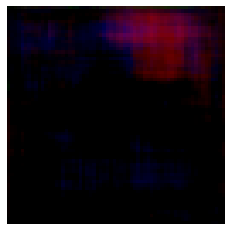

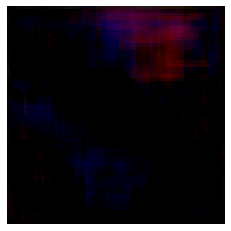

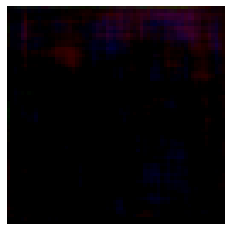

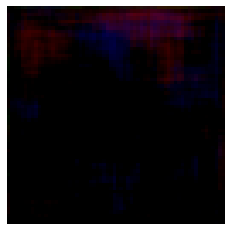

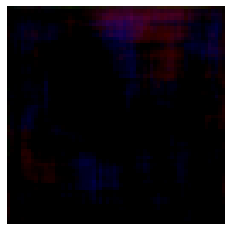

...

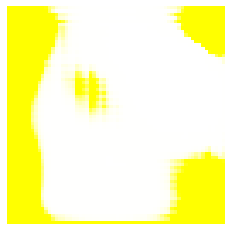

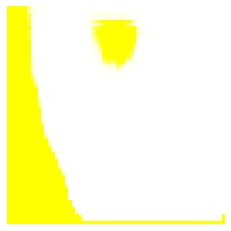

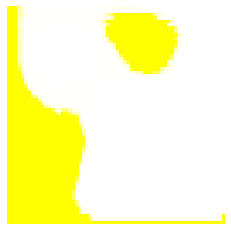

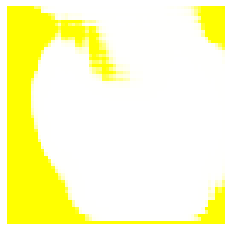

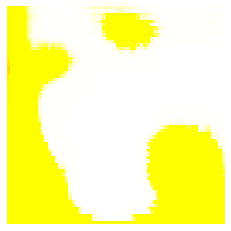

In [118]:
stage1 = StackGanStage1()
stage1.train_stage1()

In [ ]:
!zip -r /content/constants.zip /content/constants

In [ ]:
from google.colab import files
files.download("/content/constants.zip")